In [1]:
# %%
import matplotlib.pyplot as plt
import numpy as np
import gc
import torch
from utils.train_test_utils import *
from torch import nn
from torch.utils.data import Dataset, random_split, DataLoader
from torchvision import transforms
import nibabel as nib
import os
from utils.models import AutoEncoder
from torch.optim.lr_scheduler import OneCycleLR, ExponentialLR, StepLR


class CustomNIIDataset(Dataset):
    def __init__(self, img_dir, transform: transforms = None, target_transform=None):
        self.root_dir = img_dir
        self.image_files = [f for f in os.listdir(
            img_dir) if f.startswith("wm") and f.endswith(".nii")]
        self.transform = transform
        self.target_transform = target_transform

        # Determine the min and max across the dataset
        self.min_value, self.max_value = self.get_min_max()
        print(self.min_value, self.max_value)

    def get_min_max(self):
        min_val = float('inf')
        max_val = float('-inf')
        for img_file in self.image_files:
            img_name = os.path.join(self.root_dir, img_file)
            image = nib.load(img_name).get_fdata()
            min_val = min(min_val, image.min())
            max_val = max(max_val, image.max())
        return min_val, max_val

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, index):
        img_name = os.path.join(self.root_dir, self.image_files[index])
        image = nib.load(img_name).get_fdata()

        # Normalize the image to the range [0, 1]
        image = (image - self.min_value) / (self.max_value - self.min_value)

        vec = torch.from_numpy(image).float().unsqueeze(0)
        vec[torch.isnan(vec) | torch.isinf(vec)] = 0.0

        if torch.isnan(vec).any() or torch.isinf(vec).any():
            print('Warning there is nan or inf in the data!!')

        return vec, vec


def report_gpu():
    print(torch.cuda.list_gpu_processes())
    gc.collect()
    torch.cuda.empty_cache()


report_gpu()
device = device_check()

print("device:", device)

learning_rate = 0.0005
weight_decay = .01
epoches = 500

set_seed(device=device)

dataset = CustomNIIDataset(
    "/run/user/1007/gvfs/smb-share:server=144.92.237.155,share=peiran/data/imaging_data/(256, 256, 192)/images")

train_size = 384
test_size = 40

train_data, test_data = random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_data, batch_size=8,
                          shuffle=True, pin_memory=True, num_workers=os.cpu_count())
test_loader = DataLoader(test_data, batch_size=8,
                         shuffle=False, pin_memory=True, num_workers=os.cpu_count())

sample = next(iter(test_loader))


writer = create_writer("Reconstruction Tests", "autoencoder", "exp 1")


model = nn.DataParallel(AutoEncoder(
    num_transformer_layer=12)).to(device)


optimizer = torch.optim.Adam(
    model.parameters(), lr=learning_rate, weight_decay=weight_decay)

scheduler = StepLR(optimizer, step_size=5, gamma=0.95)

results = train(model, train_loader, test_loader,
                optimizer=optimizer, scheduler=scheduler, loss_fn=nn.L1Loss(),
                epochs=epoches, writer=writer, device=device)


model_weights = torch.load("../model_weights/Epoch_49.pth")
model = nn.DataParallel(AutoEncoder()).to(device)
model.load_state_dict(model_weights)


# test and see performance
output = model(sample[0][1])

output = (-623.5354614257812+7786.7138671875) * output - \
    623.5354614257812  # unnormalize x_tilde = x(max-min)+min

output_np = output.cpu().detach().numpy()
original = sample[0][1].cpu().detach().numpy()

pynvml module not found, please install pynvml
Using cuda device
device: cuda
-623.5354614257812 7786.7138671875


In [6]:
def view_nii_slices(original, generated, axis=0):
    """
    Display corresponding slices of two 3D images.

    Args:
        original: The original 3D image (numpy array).
        generated: The generated 3D image (numpy array).
        axis (int): Axis along which to display slices (0, 1, or 2).
    """
    # Determine the number of slices along the specified axis
    num_slices = original.shape[axis]

    # Display each slice
    for i in range(num_slices):
        plt.subplot(1, 2, 1)
        slice_data1 = original[i, :, :]
        plt.imshow(slice_data1, cmap='gray')
        plt.title(f"Image 1: Slice {i+1}/{num_slices}")
        plt.axis('on')

        plt.subplot(1, 2, 2)
        slice_data2 = generated[i, :, :]
        plt.imshow(slice_data2, cmap='gray')
        plt.title(f"Image 2: Slice {i+1}/{num_slices}")
        plt.axis('on')

        plt.show()

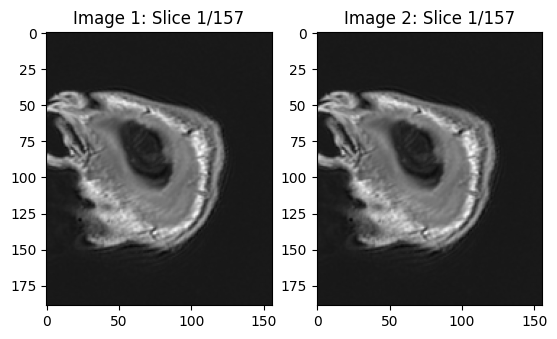

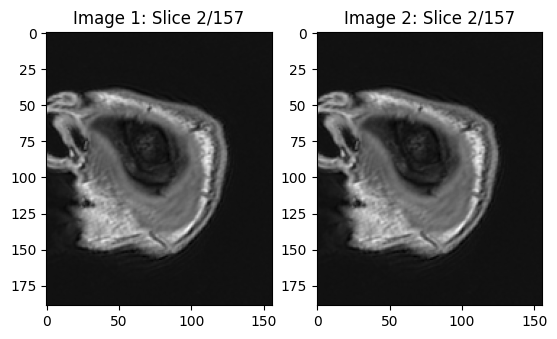

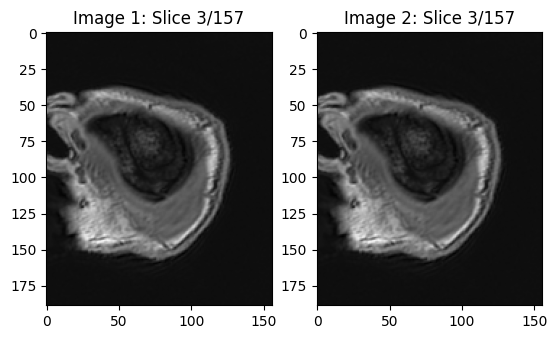

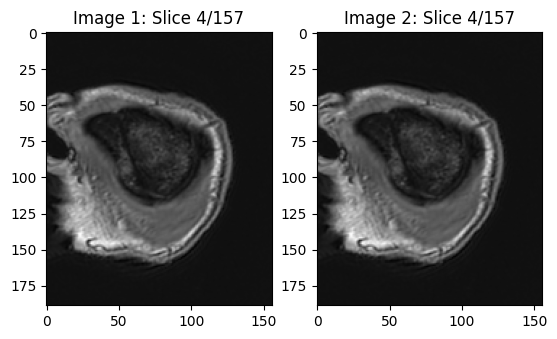

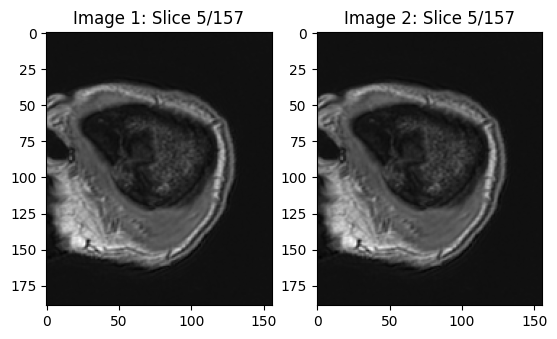

...

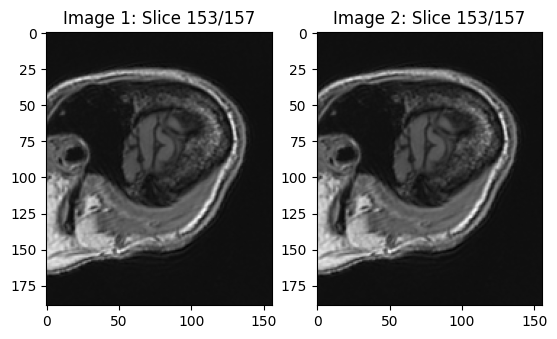

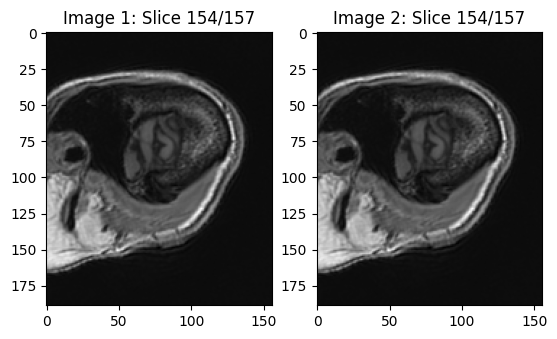

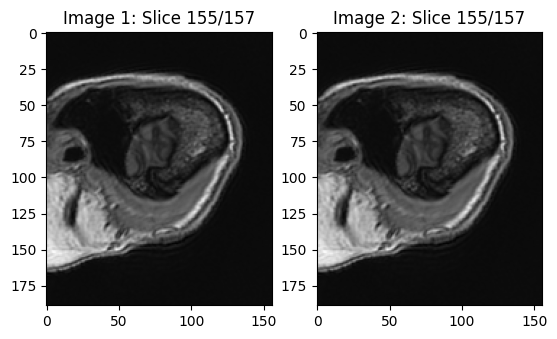

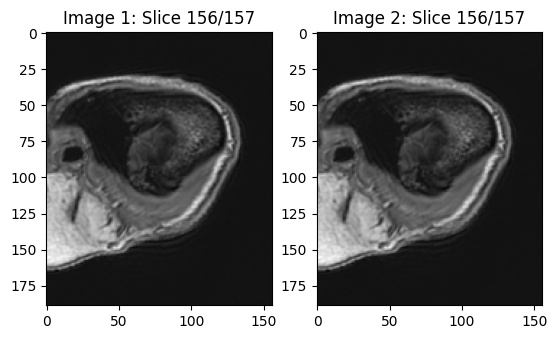

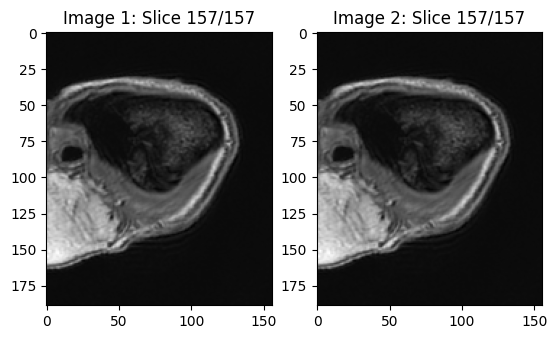

In [7]:
output_np = output.cpu().detach().numpy()
original = sample[0][1].cpu().detach().numpy()
view_nii_slices(original=original.squeeze(), generated=output_np.squeeze())

In [11]:
output = torch.from_numpy(output_np)
original = torch.from_numpy(original)

l1_loss = (nn.functional.l1_loss(output, original) +
           623.5354614257812) / (623.5354614257812+7786.7138671875)
l1_loss

tensor(0.1408)